<div style="border: 2px solid darkred; /* Add border around the box */
           color: darkred;
           display: fill;
           border-radius: 5px;
           background-color: lightgray;
           font-size: 100%;
           font-family: Verdana;
           letter-spacing: 0.8px">
  <h1 style="padding: 20px 20px;  /* Equal padding on top and bottom */
           color: darkred;
           margin: 0; /* Remove default margin to prevent extra space */
           text-align: center;"><strong>YOLOv8 Object Detection on Self-Driving-Car                                                   Data</strong></h1>
</div>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


![self_driving](https://bernardmarr.com/wp-content/uploads/2021/07/How-Tesla-Is-Using-Artificial-Intelligence-to-Create-The-Autonomous-Cars-Of-The-Future.jpg)

<div style="border: 2px solid darkred;
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.4px;
            text-align: justify; /* Align text and create even lines */
            padding: 20px;"> <!-- Added padding to create paragraph shape -->
  <p style="margin: 0;"> <!-- Removed padding from the paragraph style -->
  <h5><strong> What is YOLO?</strong></h5><br> You Only Look Once (YOLO) is a cutting-edge <strong>object detection</strong> method that significantly speeds up and simplifies the process of identifying objects in images and videos. Unlike traditional approaches, YOLO treats object detection as a single step, predicting object positions and categories directly.<br> By doing so, it achieves real-time detection without sacrificing accuracy. YOLO's neural network architecture processes images swiftly, making it valuable for applications like self-driving cars, surveillance, and robotics.<br> YOLO's unique approach has revolutionized object detection by making it faster and more accessible while maintaining high performance.
</p>
</div>


<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;"><strong>Importing libraries:</strong><br> We've brought in NumPy to empower us for various numerical operations, while Matplotlib and PIL assist with visualization. Additionally, OpenCV (cv2) aids in advanced computer vision tasks, 'glob' helps with file handling, and 'random' provides randomness for diverse scenarios
</p>
</div>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import cv2
from glob import glob
import warnings
warnings.simplefilter('ignore')

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 29.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling n

<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;">  <strong>YOLOv8</strong> is a group of neural network models. These models were created and trained using PyTorch and exported to files with the <strong>.pt</strong> extension. In this project we use the <strong> yolov8m.pt</strong>
which is a middle-sized model for object detection.<br>All YOLOv8 models for object detection ship already pre-trained on the COCO dataset, which is a huge collection of images of 80 different types.
</p>
</div>


In [6]:
import ultralytics
from ultralytics import YOLO
yolo_model = YOLO("/content/yolov8m.pt")

<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;">In this section we have loaded the <strong>self-driving-cars</strong> image dataset which is used for training and testing autonomous vehicle systems and is crucial for developing and evaluating the performance of self-driving algorithms and models. <br>Then we have
randomly selected some images to implement yolov8 model on them as samples.
</p>
</div>

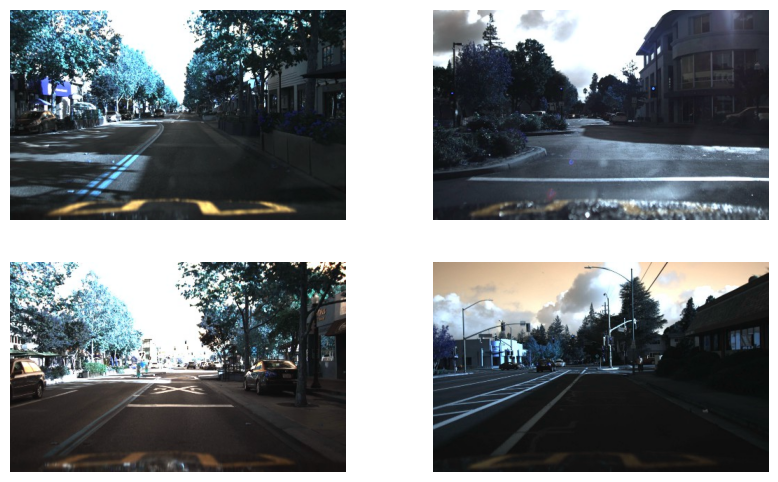

In [12]:
root_path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/images/*"
num_samples = 4
images_data = glob(root_path)
random_images = random.sample(images_data, num_samples)

plt.figure(figsize=(10, 6))
for i in range(num_samples):
  plt.subplot(2, 2, i+1)
  plt.imshow(cv2.imread(random_images[i]))
  plt.axis('off')
plt.show()

<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;">In this section, we have extracted significant results from the pre-trained YOLOv8 model, including the <strong>'name of the detected object</strong>,' <strong>'bounding box coordinates'</strong>, and <strong>'detection probabilities'</strong>.<br> The results for the samples have been calculated separately.
</p>
</div>

In [19]:
images = []
for i in range(num_samples):
  yolo_outputs = yolo_model.predict(random_images[i])
  output = yolo_outputs[0]
  box = output.boxes
  names = output.names

  for j in range(len(box)):
    labels = names[box.cls[j].item()]
    coordinates = box.xyxy[j].tolist()
    confidence = np.round(box.conf[j].item(), 2)

    print(f'Object {j + 1} is: {labels}')
    print(f'Coordinates are: {coordinates}')
    print(f'Confidence is: {confidence}')
    print('-------')

  images.append(output.plot()[:,:, ::-1])


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/images/1478020333694644558 (1).jpg: 416x640 5 cars, 1 potted plant, 1619.7ms
Speed: 7.7ms preprocess, 1619.7ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
Object 1 is: car
Coordinates are: [5.929927825927734, 143.46766662597656, 68.51243591308594, 177.06752014160156]
Confidence is: 0.88
-------
Object 2 is: car
Coordinates are: [136.99156188964844, 144.0067901611328, 159.75926208496094, 160.33004760742188]
Confidence is: 0.81
-------
Object 3 is: car
Coordinates are: [204.49481201171875, 141.35476684570312, 220.93365478515625, 154.10728454589844]
Confidence is: 0.78
-------
Object 4 is: car
Coordinates are: [155.57057189941406, 143.9827117919922, 174.59796142578125, 157.81243896484375]
Confidence is: 0.63
-------
Object 5 is: potted plant
Coordinates are: [354.6684265136719, 144.77517700195312, 392.2200622558594, 176.01373291015625]
Confidence is: 0.27
-------
Object 6 is: car
Coordinates are: [51.951908111



-------------------------------------- Images after object detection with YOLOV8 --------------------------------


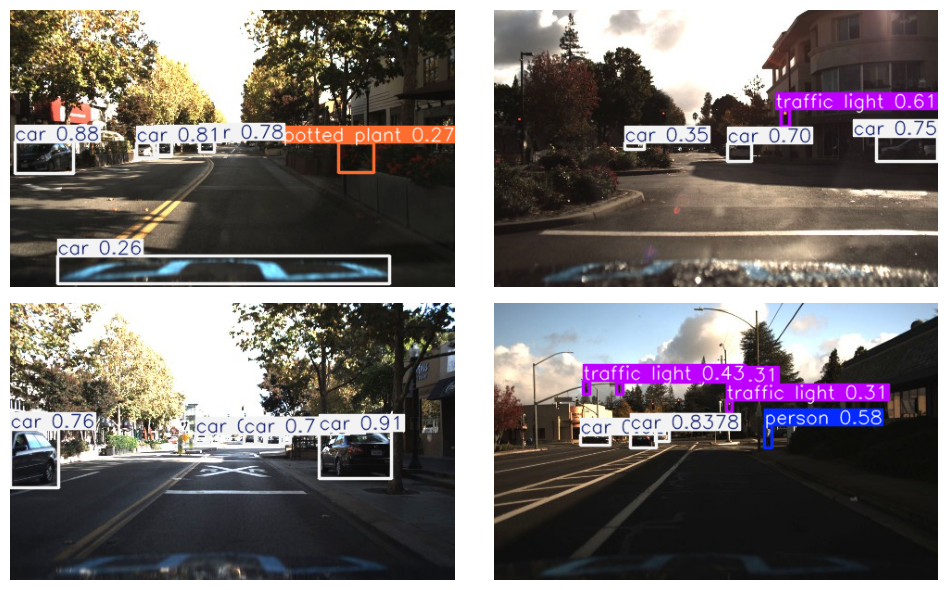

In [20]:
# plotting the images after object detection
print('\n\n-------------------------------------- Images after object detection with YOLOV8 --------------------------------')

plt.figure(figsize=(10 , 6))
for i, img in enumerate(images):
  plt.subplot(2, 2, i+1)
  plt.imshow(img)
  plt.axis("off")
plt.tight_layout()
plt.show()

In [29]:
root_path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/*"
num_samples = 25
images_data = glob(root_path)
random_images = random.sample(images_data, num_samples)

plt.figure(figsize=(20, 20))
for i in range(num_samples):
  plt.subplot(5, 5, i+1)
  plt.imshow(cv2.cvtColor(cv2.imread(random_images[i], ), cv2.COLOR_BGR2RGB))
  plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;">In this section, we have extracted significant results from the pre-trained YOLOv8 model, including the <strong>'name of the detected object</strong>,' <strong>'bounding box coordinates'</strong>, and <strong>'detection probabilities'</strong>.<br> The results for the samples have been calculated separately.
</p>
</div>

In [30]:
images = []
for i in range(num_samples):
  yolo_outputs = yolo_model.predict(random_images[i])
  output = yolo_outputs[0]
  box = output.boxes
  names = output.names

  for j in range(len(box)):
    labels = names[box.cls[j].item()]
    coordinates = box.xyxy[j].tolist()
    confidence = np.round(box.conf[j].item(), 2)

    print(f'Object {j + 1} is: {labels}')
    print(f'Coordinates are: {coordinates}')
    print(f'Confidence is: {confidence}')
    print('-------')

  images.append(output.plot()[:,:, ::-1])


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/orange_52.jpg: 640x640 3 oranges, 1930.2ms
Speed: 5.4ms preprocess, 1930.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Object 1 is: orange
Coordinates are: [216.62660217285156, 184.5417022705078, 401.00653076171875, 367.37823486328125]
Confidence is: 0.93
-------
Object 2 is: orange
Coordinates are: [360.99176025390625, 173.46038818359375, 490.8891906738281, 334.5430908203125]
Confidence is: 0.89
-------
Object 3 is: orange
Coordinates are: [368.9455261230469, 65.10236358642578, 474.12872314453125, 179.729248046875]
Confidence is: 0.48
-------

image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/banana_45.jpg: 640x608 2 bananas, 2320.5ms
Speed: 6.2ms preprocess, 2320.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 608)
Object 1 is: banana
Coordinates are: [260.85540771484375, 2.918111801147461, 590.16748046875, 699.7080688476562]
Confidence is: 0.95
-------
Object 2 is:

<div style="border: 2px solid darkred; /* Add border around the box */
            color: darkred;
            display: fill;
            border-radius: 5px;
            background-color: lightgray;
            font-size: 100%;
            font-family: Verdana;
            letter-spacing: 0.8px">
  <p style="padding: 20px 20px;  /* Equal padding on top and bottom */
            color: darkred;
            margin: 0; /* Remove default margin to prevent extra space */
            text-align: left;">In the last section, the results for the samples have been presented visually..
</p>
</div>

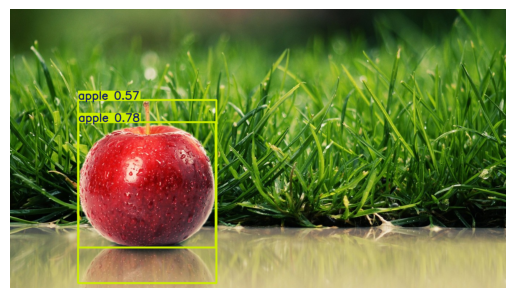

In [32]:
plt.imshow(images[2])
plt.axis("off")
plt.show()

In [36]:
# plotting the images after object detection
print('\n\n-------------------------------------- Images after object detection with YOLOV8 --------------------------------')

plt.figure(figsize=(20 , 20))
for i, img in enumerate(images):
  plt.subplot(5, 5, i+1)
  plt.imshow(img)
  plt.axis("off")
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [47]:
## Generalized Function Suitable For Any Image
def ODImage(Image):
  yolo_outputs = yolo_model.predict(Image)
  output = yolo_outputs[0]
  box = output.boxes
  names = output.names
  for j in range(len(box)):
    labels = names[box.cls[j].item()]
    coordinates = box.xyxy[j].tolist()
    confidence = np.round(box.conf[j].item(), 2)
    print(f"object {j+1} is : {labels}" )
    print(f"Coordinates are : {coordinates}")
    print(f"Confidence is : {confidence}")
  new_image = output.plot()[:,:, ::-1]
  plt.figure(figsize=(10, 6))
  plt.subplot(1, 2, 1)
  plt.imshow(cv2.cvtColor(cv2.imread(Image), cv2.COLOR_BGR2RGB))
  plt.title("Original Image")
  plt.axis("off")
  plt.subplot(1, 2, 2)
  plt.imshow(new_image)
  plt.title("Detected Image")
  plt.axis("off")
  plt.show()


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_1.jpg: 640x640 1 apple, 1584.7ms
Speed: 5.0ms preprocess, 1584.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
object 1 is : apple
Coordinates are : [26.148340225219727, 58.18088912963867, 309.49652099609375, 339.60260009765625]
Confidence is : 0.95


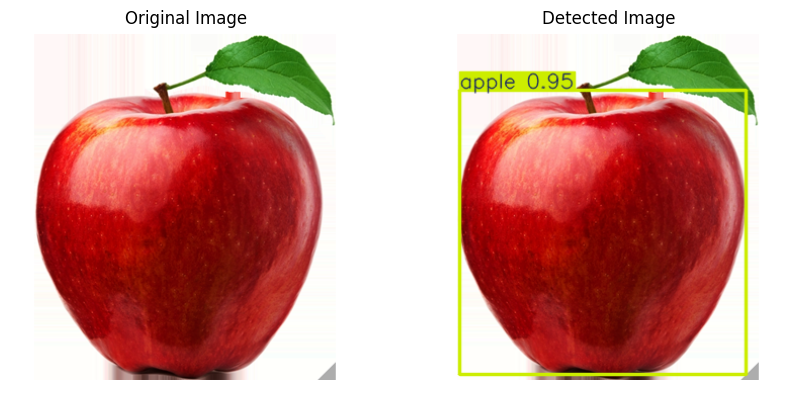

In [49]:
ODImage('/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_1.jpg')


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_10.jpg: 640x640 1 apple, 1740.3ms
Speed: 5.4ms preprocess, 1740.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
object 1 is : apple
Coordinates are : [122.84660339355469, 146.9982147216797, 1417.890380859375, 1422.4510498046875]
Confidence is : 0.93


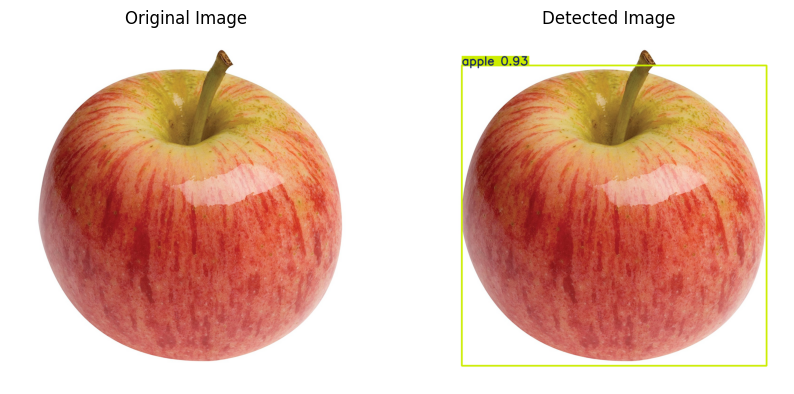

In [50]:
ODImage('/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_10.jpg')


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/orange_58.jpg: 352x640 3 oranges, 921.0ms
Speed: 3.5ms preprocess, 921.0ms inference, 2.4ms postprocess per image at shape (1, 3, 352, 640)
object 1 is : orange
Coordinates are : [293.1593322753906, 0.9993981719017029, 496.11480712890625, 178.8760223388672]
Confidence is : 0.95
object 2 is : orange
Coordinates are : [41.86543273925781, 1.0843276977539062, 335.5726318359375, 278.44195556640625]
Confidence is : 0.95
object 3 is : orange
Coordinates are : [271.47015380859375, 153.7116241455078, 559.2661743164062, 315.8290710449219]
Confidence is : 0.94


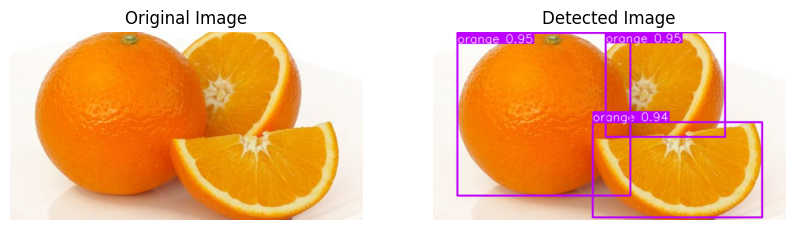

In [52]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_6.jpg: 416x640 3 apples, 1005.3ms
Speed: 3.3ms preprocess, 1005.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
object 1 is : apple
Coordinates are : [136.37599182128906, 129.1263885498047, 519.6783447265625, 527.6823120117188]
Confidence is : 0.93
object 2 is : apple
Coordinates are : [559.5946044921875, 205.13180541992188, 837.787109375, 469.8795166015625]
Confidence is : 0.88
object 3 is : apple
Coordinates are : [786.6802978515625, 188.23068237304688, 947.7295532226562, 439.7656555175781]
Confidence is : 0.75


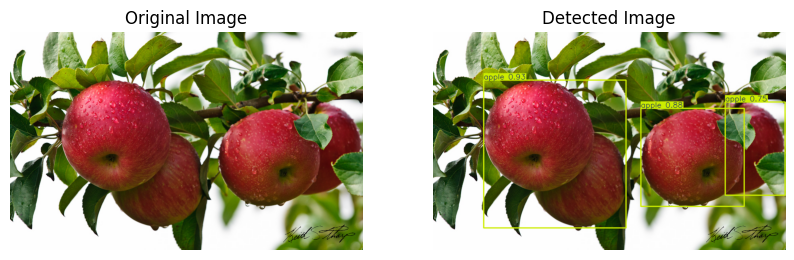

In [55]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/apple_27.jpg: 320x640 3 apples, 1053.4ms
Speed: 2.6ms preprocess, 1053.4ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)
object 1 is : apple
Coordinates are : [51.045291900634766, 0.0, 375.8228759765625, 349.6686706542969]
Confidence is : 0.95
object 2 is : apple
Coordinates are : [272.5592956542969, 41.2342529296875, 658.13623046875, 349.63323974609375]
Confidence is : 0.88
object 3 is : apple
Coordinates are : [46.755409240722656, 0.4470396041870117, 668.476806640625, 349.40545654296875]
Confidence is : 0.29


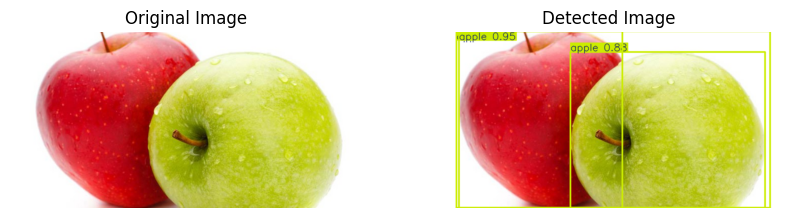

In [56]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/banana_67.jpg: 640x640 1 scissors, 1743.4ms
Speed: 3.9ms preprocess, 1743.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
object 1 is : scissors
Coordinates are : [32.07207107543945, 15.08716869354248, 322.1040954589844, 324.3332824707031]
Confidence is : 0.81


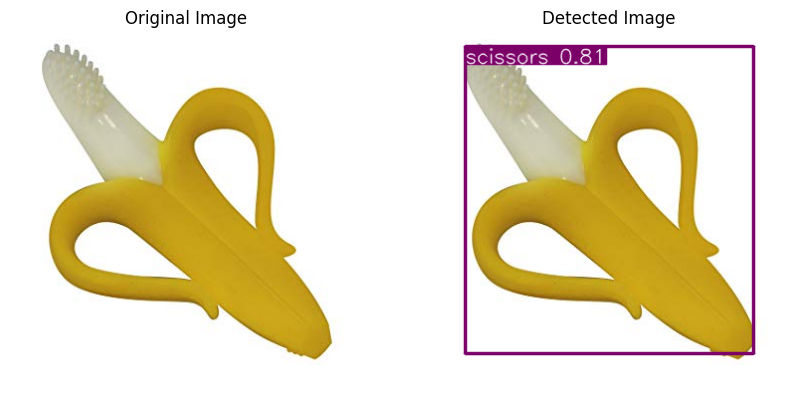

In [57]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/banana_68.jpg: 384x640 6 bananas, 1015.9ms
Speed: 4.1ms preprocess, 1015.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : banana
Coordinates are : [636.8157958984375, 1.8819563388824463, 1142.68115234375, 298.1570739746094]
Confidence is : 0.97
object 2 is : banana
Coordinates are : [0.9698218107223511, 2.0772013664245605, 405.7298583984375, 333.2721252441406]
Confidence is : 0.96
object 3 is : banana
Coordinates are : [225.07437133789062, 465.2734375, 657.6616821289062, 668.1538696289062]
Confidence is : 0.96
object 4 is : banana
Coordinates are : [497.3287353515625, 154.4202423095703, 982.5873413085938, 472.5971984863281]
Confidence is : 0.95
object 5 is : banana
Coordinates are : [19.252418518066406, 243.88792419433594, 217.5413360595703, 669.2694091796875]
Confidence is : 0.95
object 6 is : banana
Coordinates are : [813.741943359375, 505.5843505859375, 1198.819091796875, 669.13671875

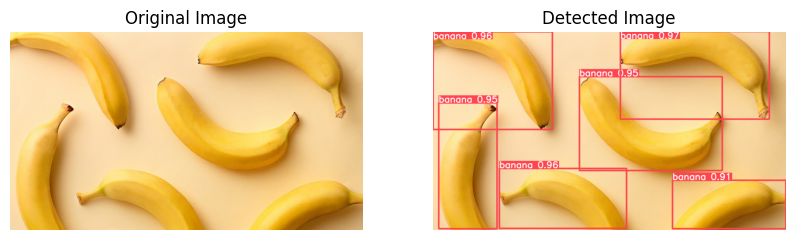

In [58]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits/orange_44.jpg: 480x640 3 oranges, 1 potted plant, 2575.5ms
Speed: 4.2ms preprocess, 2575.5ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
object 1 is : orange
Coordinates are : [141.3155975341797, 120.43417358398438, 234.8483123779297, 222.63897705078125]
Confidence is : 0.95
object 2 is : orange
Coordinates are : [210.23692321777344, 5.791204452514648, 243.424560546875, 34.215003967285156]
Confidence is : 0.72
object 3 is : orange
Coordinates are : [230.5009307861328, 21.627666473388672, 265.4218444824219, 53.66023635864258]
Confidence is : 0.68
object 4 is : potted plant
Coordinates are : [0.3787119388580322, 121.96772766113281, 124.81194305419922, 257.0]
Confidence is : 0.44


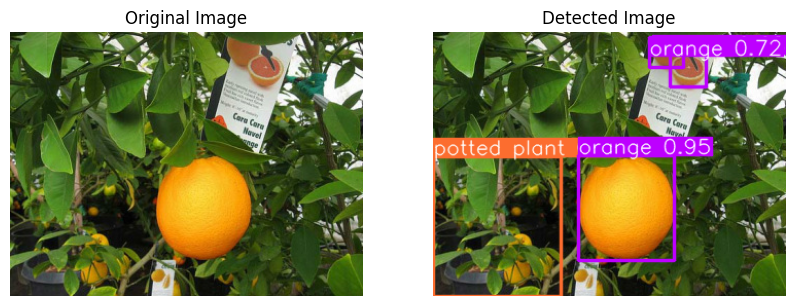

In [59]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/fruits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_10100.jpg: 384x640 1 car, 925.0ms
Speed: 2.8ms preprocess, 925.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : car
Coordinates are : [449.6093444824219, 182.71714782714844, 577.2465209960938, 224.9081573486328]
Confidence is : 0.91


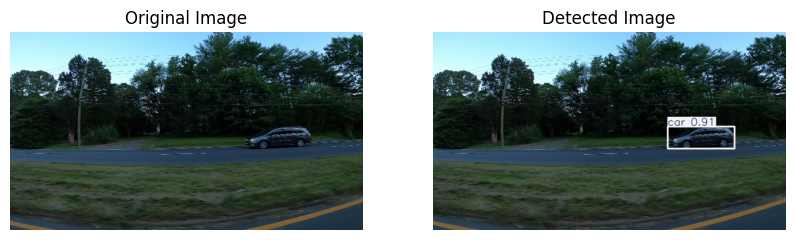

In [61]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_10120.jpg: 384x640 1 car, 997.6ms
Speed: 2.9ms preprocess, 997.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : car
Coordinates are : [176.39077758789062, 191.84046936035156, 293.775146484375, 233.11683654785156]
Confidence is : 0.9


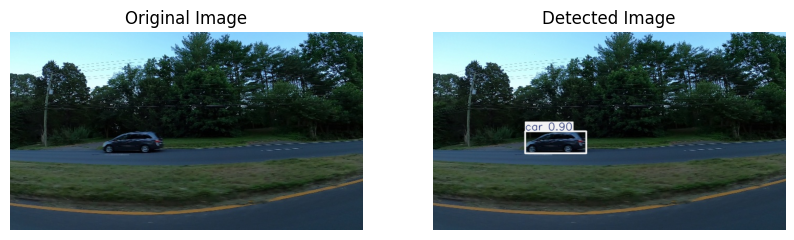

In [62]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_11060.jpg: 384x640 1 car, 1279.6ms
Speed: 3.6ms preprocess, 1279.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : car
Coordinates are : [427.0865783691406, 192.35714721679688, 445.3705139160156, 202.96649169921875]
Confidence is : 0.33


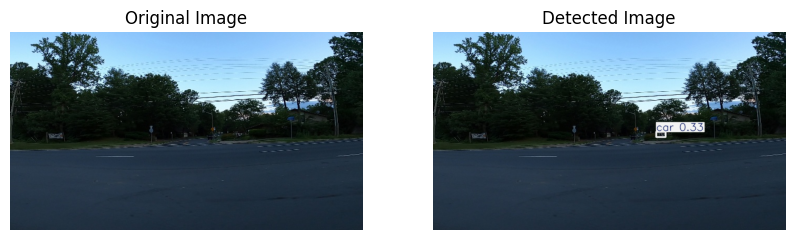

In [63]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_10740.jpg: 384x640 (no detections), 1140.3ms
Speed: 2.7ms preprocess, 1140.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


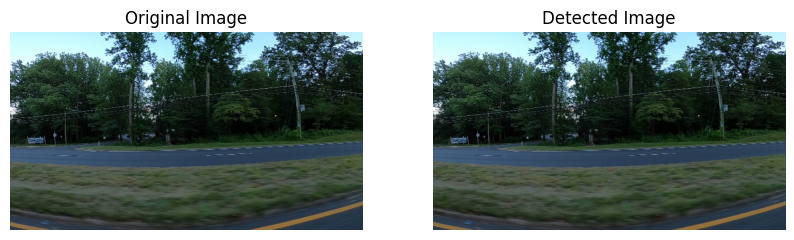

In [64]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_10340.jpg: 384x640 1 fire hydrant, 1496.0ms
Speed: 3.8ms preprocess, 1496.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : fire hydrant
Coordinates are : [178.43112182617188, 207.6140899658203, 186.34913635253906, 222.4785614013672]
Confidence is : 0.73


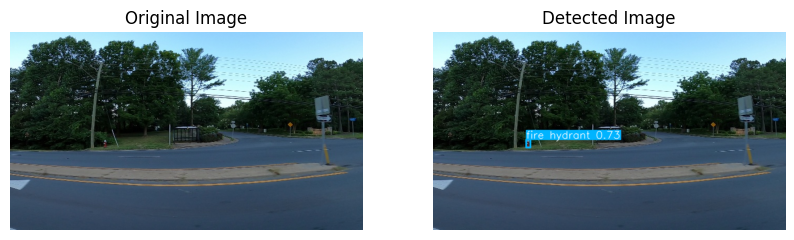

In [65]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/streets/vid_4_10560.jpg: 384x640 1 person, 1532.6ms
Speed: 3.8ms preprocess, 1532.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : person
Coordinates are : [619.7822875976562, 171.88711547851562, 628.8645629882812, 197.39752197265625]
Confidence is : 0.28


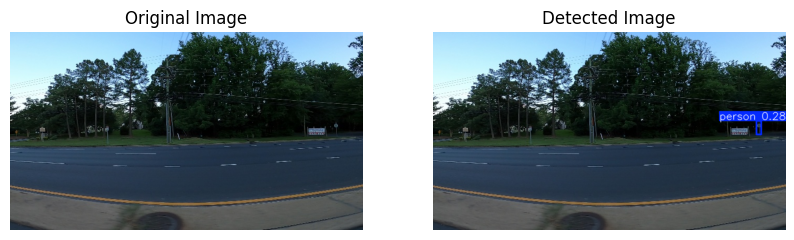

In [66]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/streets"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/digits/_20170531_120030.JPG: 544x640 (no detections), 1308.4ms
Speed: 4.2ms preprocess, 1308.4ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)


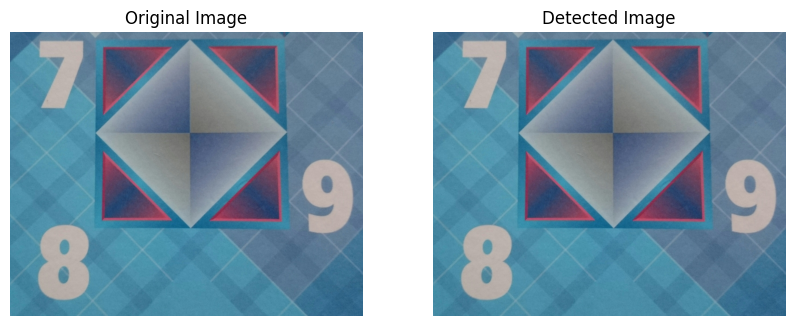

In [80]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/digits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/digits/_20170604_174201.JPG: 416x640 (no detections), 1005.4ms
Speed: 2.9ms preprocess, 1005.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


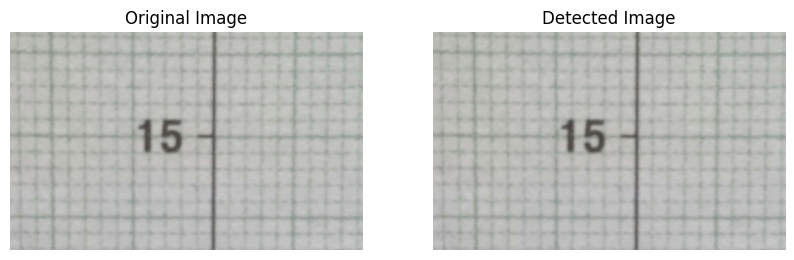

In [79]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/digits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/digits/_20170531_152631.JPG: 416x640 1 stop sign, 1136.9ms
Speed: 3.1ms preprocess, 1136.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
object 1 is : stop sign
Coordinates are : [463.7162170410156, 210.1807861328125, 2073.577880859375, 1170.6141357421875]
Confidence is : 0.62


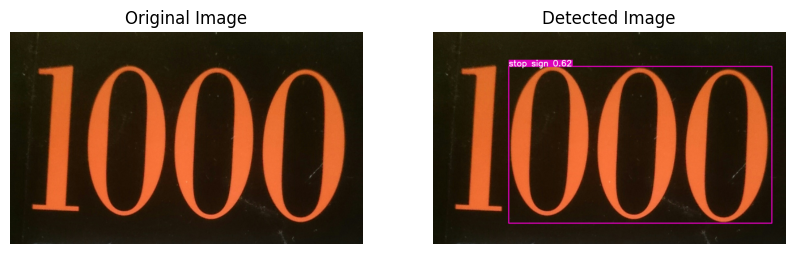

In [78]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/digits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/digits/_20170531_151057.JPG: 320x640 1 stop sign, 1172.9ms
Speed: 2.7ms preprocess, 1172.9ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 640)
object 1 is : stop sign
Coordinates are : [57.77320861816406, 52.618316650390625, 1496.2158203125, 743.5790405273438]
Confidence is : 0.82


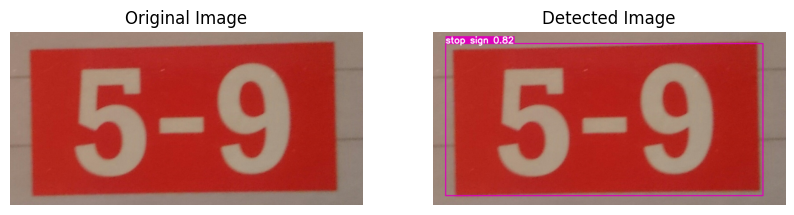

In [71]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/digits"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/69.JPEG: 384x640 1 truck, 969.7ms
Speed: 4.2ms preprocess, 969.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : truck
Coordinates are : [7.042236328125, 60.2420654296875, 1901.416259765625, 1084.5799560546875]
Confidence is : 0.77


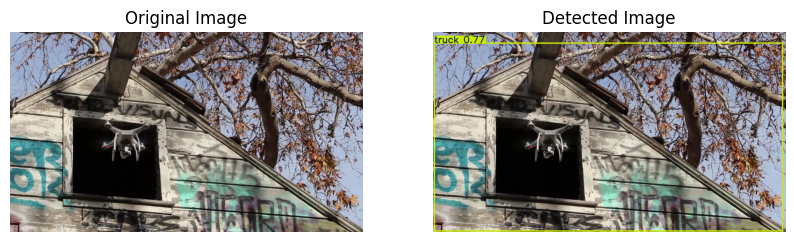

In [81]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/32.JPEG: 384x640 1 airplane, 1516.3ms
Speed: 3.1ms preprocess, 1516.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : airplane
Coordinates are : [478.8435363769531, 208.87646484375, 520.9653930664062, 246.90545654296875]
Confidence is : 0.65


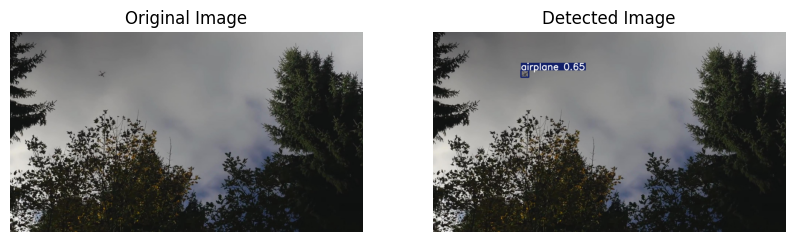

In [82]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/37.JPEG: 384x640 3 persons, 1 chair, 1263.5ms
Speed: 3.1ms preprocess, 1263.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : person
Coordinates are : [1101.0665283203125, 369.85089111328125, 1356.2720947265625, 1066.0447998046875]
Confidence is : 0.9
object 2 is : person
Coordinates are : [1442.9869384765625, 426.5055847167969, 1545.368896484375, 678.749755859375]
Confidence is : 0.72
object 3 is : person
Coordinates are : [842.7841796875, 434.6386413574219, 905.5891723632812, 650.5415649414062]
Confidence is : 0.69
object 4 is : chair
Coordinates are : [736.1658325195312, 578.02392578125, 807.1072998046875, 626.2652587890625]
Confidence is : 0.51


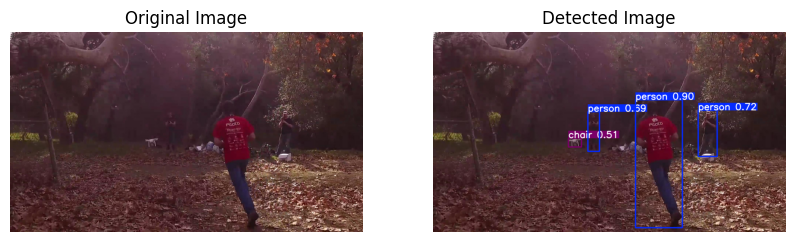

In [83]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/69.JPEG: 384x640 1 truck, 967.5ms
Speed: 4.6ms preprocess, 967.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : truck
Coordinates are : [7.042236328125, 60.2420654296875, 1901.416259765625, 1084.5799560546875]
Confidence is : 0.77


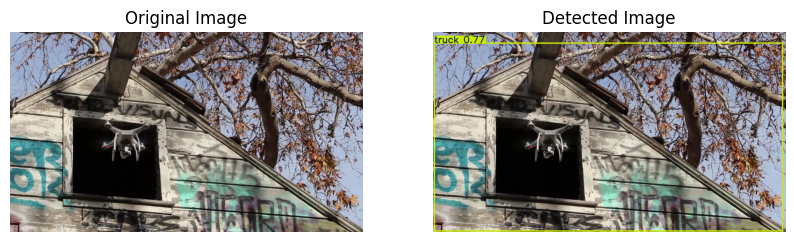

In [84]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/10.JPEG: 384x640 1 dog, 1377.5ms
Speed: 3.0ms preprocess, 1377.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : dog
Coordinates are : [1283.5419921875, 481.1444091796875, 1430.340087890625, 593.0476684570312]
Confidence is : 0.55


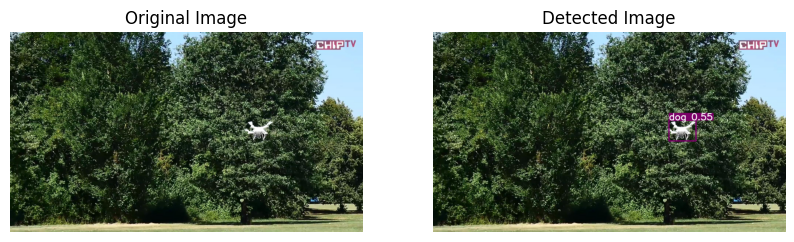

In [85]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/drones/12.JPEG: 384x640 1 person, 1 tv, 1 cell phone, 997.6ms
Speed: 4.3ms preprocess, 997.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : person
Coordinates are : [1091.927490234375, 71.52639770507812, 1642.5931396484375, 972.2567749023438]
Confidence is : 0.95
object 2 is : cell phone
Coordinates are : [1101.3577880859375, 378.5847473144531, 1168.965087890625, 452.5172424316406]
Confidence is : 0.64
object 3 is : tv
Coordinates are : [1330.89404296875, 200.5271453857422, 1459.7747802734375, 316.9955749511719]
Confidence is : 0.45


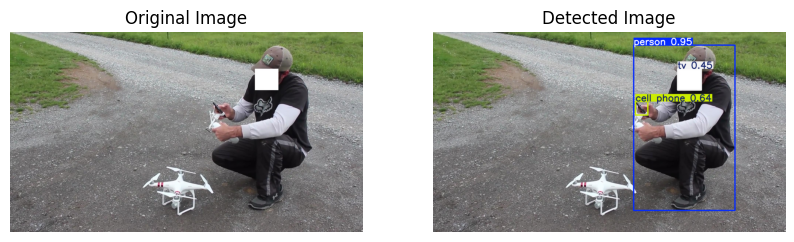

In [86]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/drones"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/People/00000870.jpg: 640x448 1 person, 2 benchs, 1448.8ms
Speed: 3.7ms preprocess, 1448.8ms inference, 14.7ms postprocess per image at shape (1, 3, 640, 448)
object 1 is : person
Coordinates are : [218.10983276367188, 319.009765625, 1000.0, 1259.46630859375]
Confidence is : 0.91
object 2 is : bench
Coordinates are : [224.35240173339844, 757.5187377929688, 960.3355102539062, 1498.885498046875]
Confidence is : 0.87
object 3 is : bench
Coordinates are : [917.8596801757812, 730.79736328125, 997.8208618164062, 886.447998046875]
Confidence is : 0.59


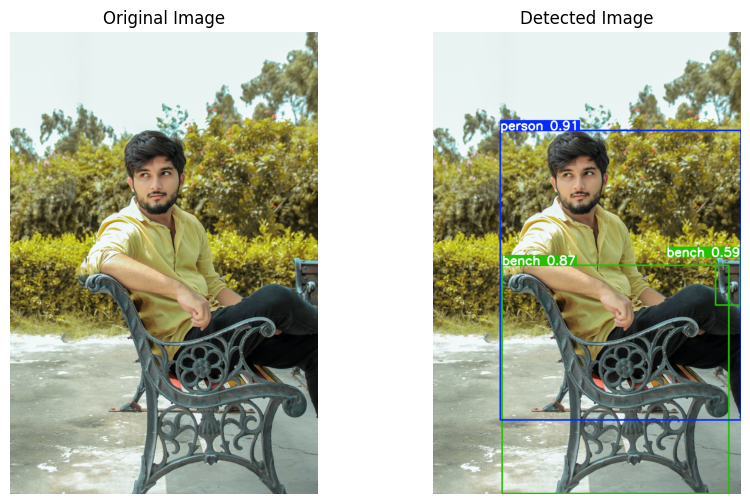

In [87]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/People"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/People/00000872.jpg: 480x640 1 person, 1509.4ms
Speed: 5.9ms preprocess, 1509.4ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)
object 1 is : person
Coordinates are : [120.86786651611328, 14.12527084350586, 289.743896484375, 260.4941101074219]
Confidence is : 0.96


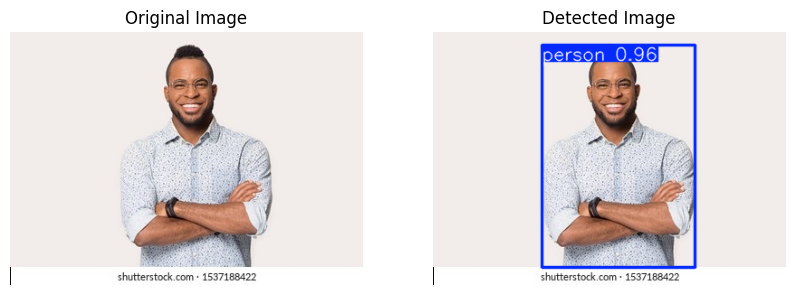

In [88]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/People"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/People/00000869.jpg: 480x640 1 person, 1 bird, 2576.8ms
Speed: 5.2ms preprocess, 2576.8ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)
object 1 is : person
Coordinates are : [383.142578125, 0.0, 1272.6470947265625, 862.4042358398438]
Confidence is : 0.96
object 2 is : bird
Coordinates are : [189.08926391601562, 188.60218811035156, 614.7291259765625, 580.1949462890625]
Confidence is : 0.75


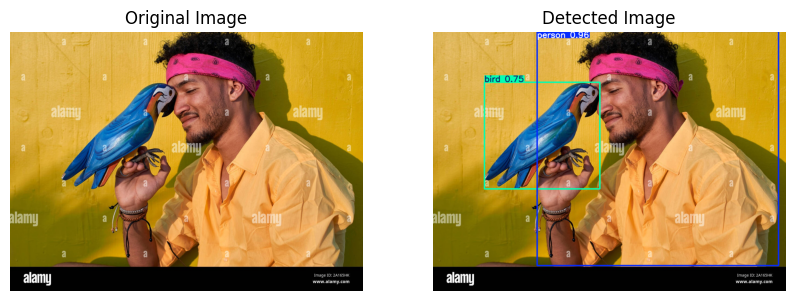

In [89]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/People"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/People/00000864.jpg: 512x640 2 persons, 1 tie, 1717.5ms
Speed: 5.3ms preprocess, 1717.5ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)
object 1 is : tie
Coordinates are : [221.84860229492188, 467.5678405761719, 393.71490478515625, 775.8304443359375]
Confidence is : 0.93
object 2 is : person
Coordinates are : [17.919879913330078, 32.5638542175293, 908.912109375, 774.2047729492188]
Confidence is : 0.92
object 3 is : person
Coordinates are : [1.1832032203674316, 684.80517578125, 169.7620391845703, 775.620361328125]
Confidence is : 0.37


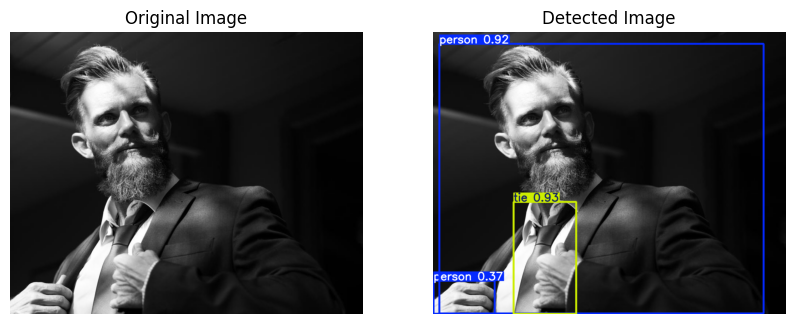

In [90]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/People"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/People/00000875.jpg: 480x640 1 person, 1 frisbee, 1172.5ms
Speed: 3.4ms preprocess, 1172.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
object 1 is : person
Coordinates are : [441.82037353515625, 156.5662384033203, 770.8634033203125, 531.6549682617188]
Confidence is : 0.95
object 2 is : frisbee
Coordinates are : [0.942840576171875, 0.2162933349609375, 796.0553588867188, 531.6527709960938]
Confidence is : 0.36


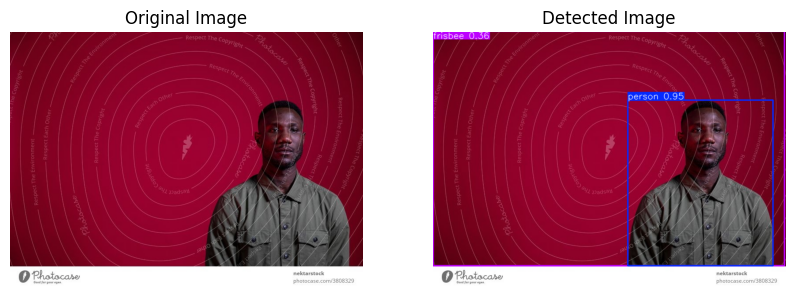

In [91]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/People"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers/0038.jpg: 480x640 (no detections), 1333.9ms
Speed: 3.2ms preprocess, 1333.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


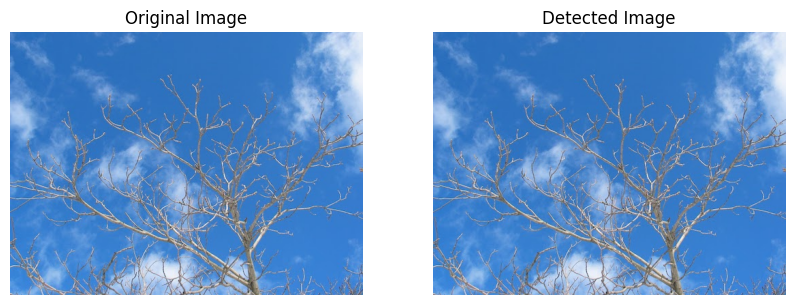

In [92]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers/0030.jpg: 480x640 (no detections), 1603.0ms
Speed: 3.2ms preprocess, 1603.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


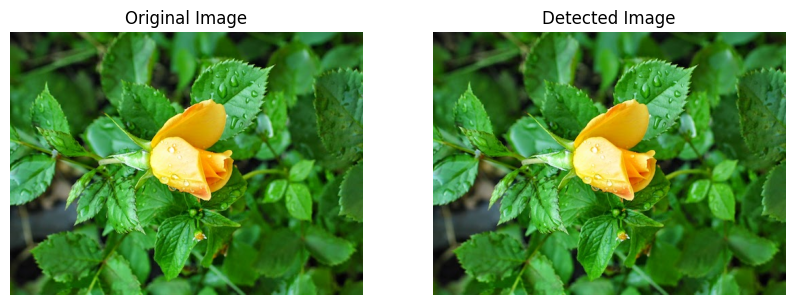

In [93]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers/0003.jpg: 640x480 (no detections), 1555.3ms
Speed: 4.7ms preprocess, 1555.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


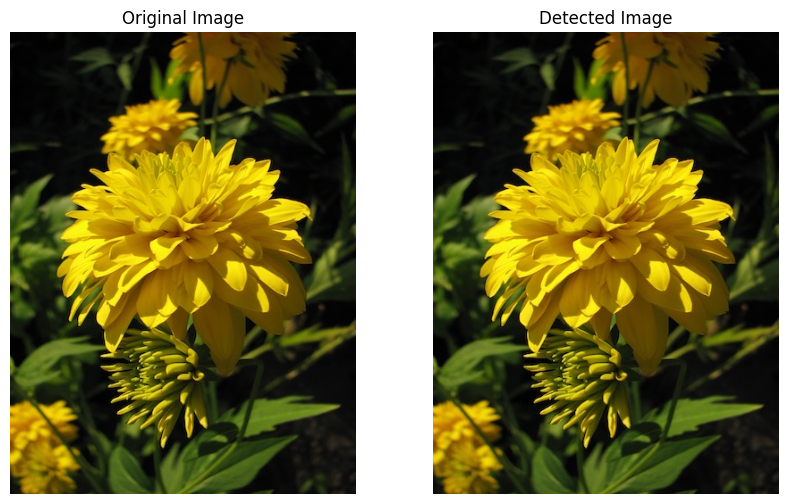

In [94]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers/0017.jpg: 480x640 1 potted plant, 1513.7ms
Speed: 3.6ms preprocess, 1513.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
object 1 is : potted plant
Coordinates are : [1.7668522596359253, 1.7872545719146729, 461.65863037109375, 383.4628601074219]
Confidence is : 0.38


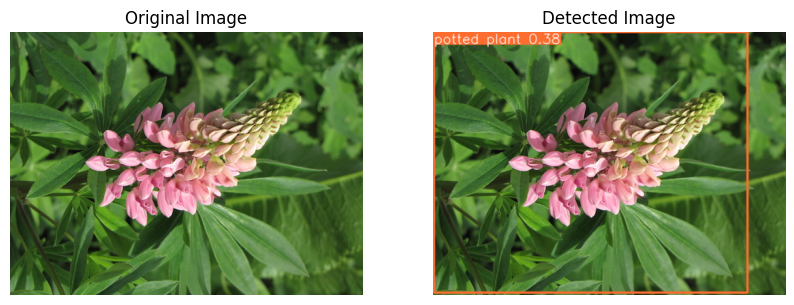

In [95]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/flowers"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/guns/41.jpeg: 512x640 2 persons, 1 car, 2 benchs, 1435.7ms
Speed: 3.6ms preprocess, 1435.7ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)
object 1 is : person
Coordinates are : [0.695842981338501, 1.0267717838287354, 161.86221313476562, 193.3712615966797]
Confidence is : 0.87
object 2 is : bench
Coordinates are : [155.30569458007812, 109.61738586425781, 195.7259521484375, 180.70436096191406]
Confidence is : 0.44
object 3 is : bench
Coordinates are : [178.66647338867188, 117.74877166748047, 194.3458251953125, 135.03883361816406]
Confidence is : 0.33
object 4 is : car
Coordinates are : [96.4205322265625, 94.5177230834961, 115.0912094116211, 123.21479797363281]
Confidence is : 0.31
object 5 is : person
Coordinates are : [187.65167236328125, 101.41527557373047, 192.4883270263672, 111.46760559082031]
Confidence is : 0.27


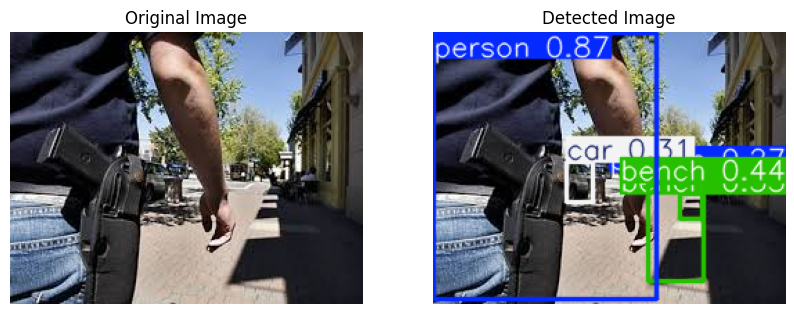

In [96]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/guns"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/guns/61.jpeg: 384x640 2 persons, 1 cell phone, 1953.7ms
Speed: 5.8ms preprocess, 1953.7ms inference, 8.9ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : person
Coordinates are : [106.46460723876953, 3.6107089519500732, 215.4555206298828, 165.11712646484375]
Confidence is : 0.93
object 2 is : person
Coordinates are : [58.66388702392578, 40.21049118041992, 127.99916076660156, 166.06256103515625]
Confidence is : 0.87
object 3 is : cell phone
Coordinates are : [164.8423614501953, 50.72416687011719, 192.83192443847656, 79.55570983886719]
Confidence is : 0.45


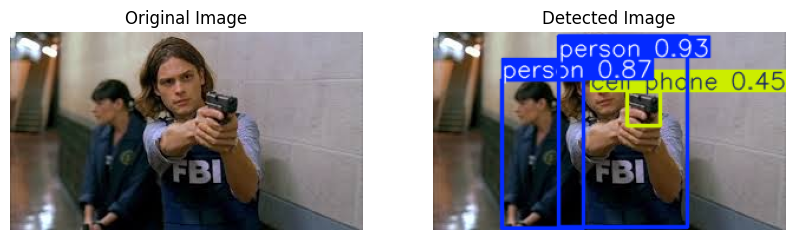

In [97]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/guns"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/guns/37.jpeg: 288x640 1 person, 1532.4ms
Speed: 2.6ms preprocess, 1532.4ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)
object 1 is : person
Coordinates are : [67.36909484863281, 5.630590915679932, 142.4524383544922, 141.7140350341797]
Confidence is : 0.84


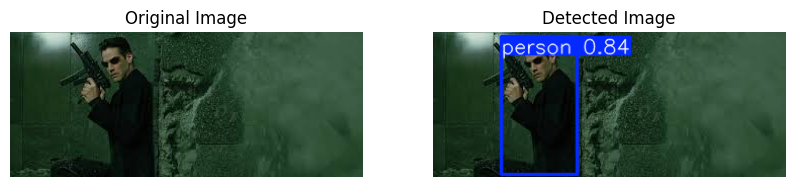

In [98]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/guns"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/guns/55.jpeg: 384x640 1 person, 939.7ms
Speed: 3.4ms preprocess, 939.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
object 1 is : person
Coordinates are : [34.927764892578125, 6.241347312927246, 224.46998596191406, 166.1429901123047]
Confidence is : 0.95


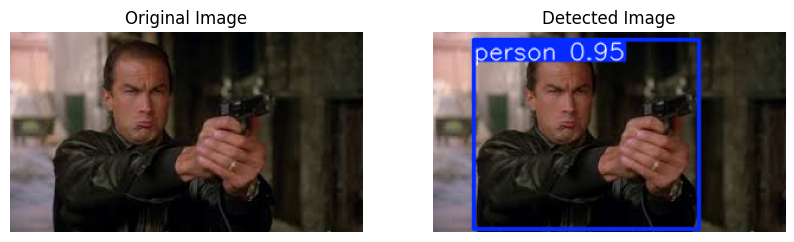

In [99]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/guns"
ODImage(os.path.join(path, random.choice(os.listdir(path))))


image 1/1 /content/drive/MyDrive/Hesham AsemCourse/Day 09/guns/58.jpeg: 448x640 1 person, 1074.6ms
Speed: 3.0ms preprocess, 1074.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
object 1 is : person
Coordinates are : [44.35502243041992, 50.4073486328125, 156.02481079101562, 178.92262268066406]
Confidence is : 0.9


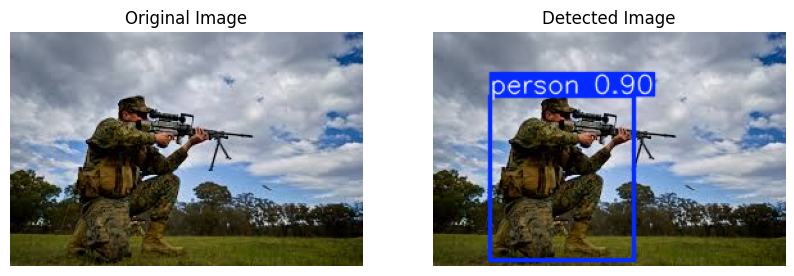

In [100]:
path = "/content/drive/MyDrive/Hesham AsemCourse/Day 09/guns"
ODImage(os.path.join(path, random.choice(os.listdir(path))))

## Thank you for reaching the end of this notebook!